content 디렉토리가 구글 클라우드의 리눅스의 개인 계정을 위한 home 디렉토리라고 생각하면 됨


<div><div class="highlight-default notranslate"><div class="highlight"><pre><span></span>content/
├─ scripts/ (Google Drive Mount)
│  └─ preprocessing/
├─ models/
│  ├─ community/
│  ├─ official/
│  ├─ orbit/
│  ├─ research/
│  └─ ...
└─ workspace/ (Google Drive Mount)
    └─ training_demo/
</pre></div>


<div><div class="highlight-default notranslate"><div class="highlight"><pre><span></span>training_demo/
├─ annotations/
├─ exported-models/
├─ images/
│  ├─ test/
│  └─ train/
├─ models/
├─ pre-trained-models/
└─ README.md
</pre></div>

* annotations: This folder will be used to store all *.csv files and the respective TensorFlow *.record files, which contain the list of annotations for our dataset images.

* exported-models: This folder will be used to store exported versions of our trained model(s).

* images: This folder contains a copy of all the images in our dataset, as well as the respective *.xml files produced for each one, once labelImg is used to annotate objects.

   * images/train: This folder contains a copy of all images, and the respective *.xml files, which will be used to train our model.

   * images/test: This folder contains a copy of all images, and the respective *.xml files, which will be used to test our model.

* models: This folder will contain a sub-folder for each of training job. Each subfolder will contain the training pipeline configuration file *.config, as well as all files generated during the training and evaluation of our model.

* pre-trained-models: This folder will contain the downloaded pre-trained models, which shall be used as a starting checkpoint for our training jobs.

In [ ]:
from google.colab import drive
drive.mount('/content/google_drive')

Mounted at /content/google_drive


In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/scripts"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models"

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/pre-trained-models"

구글드라이브에 workspace를 구성하기 위해 단 한번만 아래의 압축파일 복사와 압축 해제 명령어를 수행한다.

In [ ]:
!pwd

/content


In [ ]:
!cp "/content/google_drive/MyDrive/Tensorflow_OD_API/datasets/VOCtrainval_11-May-2012.tar" ./

In [ ]:
!pwd

/content


In [ ]:
# !tar -xvf /content/VOCtrainval_11-May-2012.tar 

In [ ]:
!tar -xvf ./VOCtrainval_11-May-2012.tar 

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
VOCdevkit/VOC2012/SegmentationClass/2008_001874.png
VOCdevkit/VOC2012/SegmentationClass/2008_001876.png
VOCdevkit/VOC2012/SegmentationClass/2008_001882.png
VOCdevkit/VOC2012/SegmentationClass/2008_001885.png
VOCdevkit/VOC2012/SegmentationClass/2008_001895.png
VOCdevkit/VOC2012/SegmentationClass/2008_001896.png
VOCdevkit/VOC2012/SegmentationClass/2008_001926.png
VOCdevkit/VOC2012/SegmentationClass/2008_001966.png
VOCdevkit/VOC2012/SegmentationClass/2008_001971.png
VOCdevkit/VOC2012/SegmentationClass/2008_001992.png
VOCdevkit/VOC2012/SegmentationClass/2008_001997.png
VOCdevkit/VOC2012/SegmentationClass/2008_002032.png
VOCdevkit/VOC2012/SegmentationClass/2008_002043.png
VOCdevkit/VOC2012/SegmentationClass/2008_002064.png
VOCdevkit/VOC2012/SegmentationClass/2008_002066.png
VOCdevkit/VOC2012/SegmentationClass/2008_002067.png
VOCdevkit/VOC2012/SegmentationClass/2008_002073.png
VOCdevkit/VOC2012/SegmentationClass/2008_002079.png
VOCdevkit/VOC2012/Segmentati

In [ ]:
!ls -al

total 2159840
drwxr-xr-x  1 root root       4096 Nov 15 01:20 .
drwxr-xr-x  1 root root       4096 Nov 15 00:20 ..
drwxr-xr-x  8 root root       4096 Nov 15 00:36 cocoapi
drwxr-xr-x  4 root root       4096 Nov 11 14:31 .config
-rw-r--r--  1 root root  211996178 Jul 11  2020 faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
drwx------  5 root root       4096 Nov 15 00:25 google_drive
drwxr-xr-x 10 root root       4096 Nov 15 00:27 models
drwxr-xr-x  1 root root       4096 Nov 11 14:32 sample_data
drwxrwxrwx  3 root root       4096 May 11  2012 VOCdevkit
-rw-------  1 root root 1999639040 Nov 15 01:20 VOCtrainval_11-May-2012.tar


In [ ]:
# %cd ./VOCdevkit/VOC2012/JPEGImages/

In [ ]:
# !ls -l | grep ^- | wc -l

In [ ]:
imageDir = "/content/VOCdevkit/VOC2012/JPEGImages"

In [ ]:
images = [f for f in os.listdir(imageDir)
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg|.png)$', f)]        # 리눅스 정규식 표현 : 파일에 a-z,A-Z,0-9라 적혀있는 파일이면 모두 가져온다.

In [ ]:
ratio=0.1

In [ ]:
num_images = len(images)
num_test_images = math.ceil(ratio*num_images)
print(num_test_images)

1713


In [ ]:
train_dir = "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"
test_dir = "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test"

In [ ]:
source = imageDir

In [ ]:
copy_xml=True

In [ ]:
sourceXML="/content/VOCdevkit/VOC2012/Annotations"

In [ ]:
for i in range(num_test_images):
  idx = random.randint(0, len(images)-1)
  filename = images[idx]
  copyfile(os.path.join(source, filename), os.path.join(test_dir, filename))
  if copy_xml:
    xml_filename = os.path.splitext(filename)[0]+'.xml'
    copyfile(os.path.join(sourceXML, xml_filename), os.path.join(test_dir,xml_filename))

  images.remove(images[idx])

# for filename in images:
#   copyfile(os.path.join(source, filename), os.path.join(train_dir, filename))
#   if copy_xml:
#     xml_filename = os.path.splitext(filename)[0]+'.xml'
#     print(copyfile(os.path.join(sourceXML, xml_filename), os.path.join(train_dir, xml_filename)))

In [ ]:
for filename in images:
  copyfile(os.path.join(source, filename), os.path.join(train_dir, filename))
  if copy_xml:
    xml_filename = os.path.splitext(filename)[0]+'.xml'
    print(copyfile(os.path.join(sourceXML, xml_filename), os.path.join(train_dir, xml_filename)))

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2009_003722.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2009_001734.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2011_001624.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2009_001375.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2008_004055.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2008_002820.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2008_005158.xml
/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/trainin

In [ ]:
%cd /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train


In [ ]:
!ls -l | grep ^- | wc -l

30824


In [ ]:
!ls -al

total 1714844
-rw------- 1 root root 145493 Nov 15 01:24 2007_000027.jpg
-rw------- 1 root root   1151 Nov 15 01:24 2007_000027.xml
-rw------- 1 root root  64668 Nov 15 01:25 2007_000039.jpg
-rw------- 1 root root    553 Nov 15 01:25 2007_000039.xml
-rw------- 1 root root  82847 Nov 15 01:25 2007_000042.jpg
-rw------- 1 root root    776 Nov 15 01:25 2007_000042.xml
-rw------- 1 root root  73156 Nov 15 01:25 2007_000061.jpg
-rw------- 1 root root    773 Nov 15 01:25 2007_000061.xml
-rw------- 1 root root 126171 Nov 15 01:25 2007_000063.jpg
-rw------- 1 root root    771 Nov 15 01:25 2007_000063.xml
-rw------- 1 root root 101159 Nov 15 01:24 2007_000068.jpg
-rw------- 1 root root    545 Nov 15 01:24 2007_000068.xml
-rw------- 1 root root  79773 Nov 15 01:25 2007_000123.jpg
-rw------- 1 root root    551 Nov 15 01:25 2007_000123.xml
-rw------- 1 root root 105670 Nov 15 01:25 2007_000129.jpg
-rw------- 1 root root   1676 Nov 15 01:25 2007_000129.xml
-rw------- 1 root root  77994 Nov 15 01:24

15,412 * 2 = 30,824

In [ ]:
%cd "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train


In [ ]:
!pwd

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train


In [ ]:
!ls -l | grep ^- | wc -l

30824


In [ ]:
!nvidia-smi

In [ ]:
# This Colab requires TF 2.5.
!pip install -U "tensorflow>=2.5"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 578.0 MB 15 kB/s 
     |████████████████████████████████| 438 kB 83.8 MB/s 
     |████████████████████████████████| 5.9 MB 70.0 MB/s 
     |████████████████████████████████| 1.7 MB 26.0 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.9.0
    Uninstalling tensorflow-estimator-2.9.0:
      Successfully uninstalled tensorflow-estimator-2.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.9.1
    Uninstalling tensorboard-2.9.1:
      Successfully uninstalled tensorboard-2.9.1
  Attempting uninstall: keras
    Found existing installation: keras 2.9.0
    Uninstalling keras-2.9.0:
      Successfully uninstalled keras-2.9.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully u

In [ ]:
!pip install pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import os
import pathlib
import time

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
# import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [ ]:
import re
from shutil import copyfile
import argparse
import math
import random

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

In [ ]:
!pwd

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train


In [ ]:
%cd /content/

/content


In [ ]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3529, done.
remote: Counting objects: 100% (3529/3529), done.
remote: Compressing objects: 100% (2939/2939), done.
remote: Total 3529 (delta 928), reused 1439 (delta 536), pack-reused 0
Receiving objects: 100% (3529/3529), 47.00 MiB | 22.05 MiB/s, done.
Resolving deltas: 100% (928/928), done.


리눅스 계열
* 데이반 : 소프트웨어 설치 방식 : apt[S/W 설치 프로그램]

* 레드햇 : 소프트웨어 설치 방식 : yum[S/W 설치 프로그램]

In [ ]:
!sudo apt install -y protobuf-compiler

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.


In [ ]:
!cd /content/models/research

In [ ]:
!pwd

/content/models/research


In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
!git clone https://github.com/cocodataset/cocoapi.git

In [ ]:
%cd /content/cocoapi/PythonAPI

/content/cocoapi/PythonAPI


In [ ]:
!make

In [ ]:
!ls -al

total 1780
drwxr-xr-x 3 root root    4096 Nov 15 00:38 .
drwxr-xr-x 8 root root    4096 Nov 15 00:36 ..
-rw-r--r-- 1 root root     199 Nov 15 00:36 Makefile
-rw-r--r-- 1 root root 1790308 Nov 15 00:36 pycocoDemo.ipynb
-rw-r--r-- 1 root root    4456 Nov 15 00:36 pycocoEvalDemo.ipynb
drwxr-xr-x 2 root root    4096 Nov 15 00:38 pycocotools
-rw-r--r-- 1 root root     762 Nov 15 00:36 setup.py


In [ ]:
!cp -r pycocotools /content/models/research

In [ ]:
%cd /content

/content


In [ ]:
%cd /content/models/research

/content/models/research


In [ ]:
!ls -al

total 100
drwxr-xr-x 23 root root 4096 Nov 15 00:39 .
drwxr-xr-x 10 root root 4096 Nov 15 00:27 ..
drwxr-xr-x  3 root root 4096 Nov 15 00:27 adversarial_text
drwxr-xr-x  3 root root 4096 Nov 15 00:27 attention_ocr
drwxr-xr-x  4 root root 4096 Nov 15 00:27 audioset
drwxr-xr-x  2 root root 4096 Nov 15 00:27 autoaugment
drwxr-xr-x  4 root root 4096 Nov 15 00:27 cognitive_planning
drwxr-xr-x  7 root root 4096 Nov 15 00:27 cvt_text
drwxr-xr-x  9 root root 4096 Nov 15 00:27 deeplab
drwxr-xr-x  3 root root 4096 Nov 15 00:27 deep_speech
drwxr-xr-x  3 root root 4096 Nov 15 00:27 delf
drwxr-xr-x  8 root root 4096 Nov 15 00:27 efficient-hrl
drwxr-xr-x  3 root root 4096 Nov 15 00:27 lfads
drwxr-xr-x 13 root root 4096 Nov 15 00:27 lstm_object_detection
drwxr-xr-x  2 root root 4096 Nov 15 00:27 marco
drwxr-xr-x  2 root root 4096 Nov 15 00:27 nst_blogpost
drwxr-xr-x 27 root root 4096 Nov 15 00:27 object_detection
drwxr-xr-x  2 root root 4096 Nov 15 00:27 pcl_rl
drwxr-xr-x  2 root root 4096 Nov 15 00:

In [ ]:
!pwd

/content/models/research


In [ ]:
!cp object_detection/packages/tf2/setup.py .

In [ ]:
!python -m pip install .

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

In [ ]:
# %%bash
# sudo apt install -y protobuf-compiler
# cd models/research/
# protoc object_detection/protos/*.proto --python_out=.
# cp object_detection/packages/tf2/setup.py .
# python -m pip install .

In [ ]:
 # !ls -al "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/models"

In [ ]:
# !rm -r "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/models"

In [ ]:
!cp "/content/models/research/object_detection/data/pascal_label_map.pbtxt" \
"/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations"

In [ ]:
!mv "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/pascal_label_map.pbtxt" \
"/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt"

In [ ]:
%cd "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing"

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing


In [ ]:
!pwd

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train


In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

In [ ]:
!python generate_tfrecord.py \
-x "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train" \
-l "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt" \
-o "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/train.record"

2022-11-15 01:30:00.117534: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Successfully created the TFRecord file: /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/train.record


In [ ]:
!python generate_tfrecord.py \
-x "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test" \
-l "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt" \
-o "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/test.record"

In [ ]:
!ls -al "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations"

total 1832585
-rw------- 1 root root        705 Nov 14 08:05 label_map.pbtxt
-rw------- 1 root root  138271787 Nov 14 08:11 test.record
-rw------- 1 root root 1738293650 Nov 15 01:31 train.record


In [ ]:
!pwd

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing


In [ ]:
%cd /content

/content


In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2022-11-15 00:51:13--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.97.128, 2404:6800:4008:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.97.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  47.4MB/s    in 4.3s    

2022-11-15 00:51:19 (47.4 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]



In [ ]:
!tar xvfzp "/content/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz" \
-C "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/pre-trained-models"

faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.index
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/saved_model.pb
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!cp "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/pipeline.config" \
"/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
%tensorboard --logdir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--pipeline_config_path="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config"

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--pipeline_config_path="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
--checkpoint_dir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!ps 

In [ ]:
!kill 4231 

In [ ]:
!ps

In [ ]:
%tensorboard --logdir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

<IPython.core.display.Javascript object>

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"

In [ ]:
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
--trained_checkpoint_dir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--output_directory "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"

2022-11-15 03:29:27.518787: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-15 03:29:28.230908: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-15 03:29:28.230997: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-15 03:29:28.231013: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

In [ ]:
PATH_TO_MODEL_DIR = "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"
print(PATH_TO_SAVED_MODEL)

/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1/saved_model


In [ ]:
import time

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 9.213520526885986 seconds


In [ ]:
PATH_TO_LABELS = '/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
TEST_IMAGE_PATH = "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/"

In [ ]:
IMAGE_PATHS = [TEST_IMAGE_PATH + f for f in os.listdir('/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test')
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg)$', f)] 

In [ ]:
IMAGE_PATHS_SELS = IMAGE_PATHS[1000:1005]

In [ ]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

Running inference for /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2008_001843.jpg... Done
Running inference for /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2008_007843.jpg... Done
Running inference for /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2009_004159.jpg... Done
Running inference for /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2011_002366.jpg... Done
Running inference for /content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2012_001877.jpg... Done


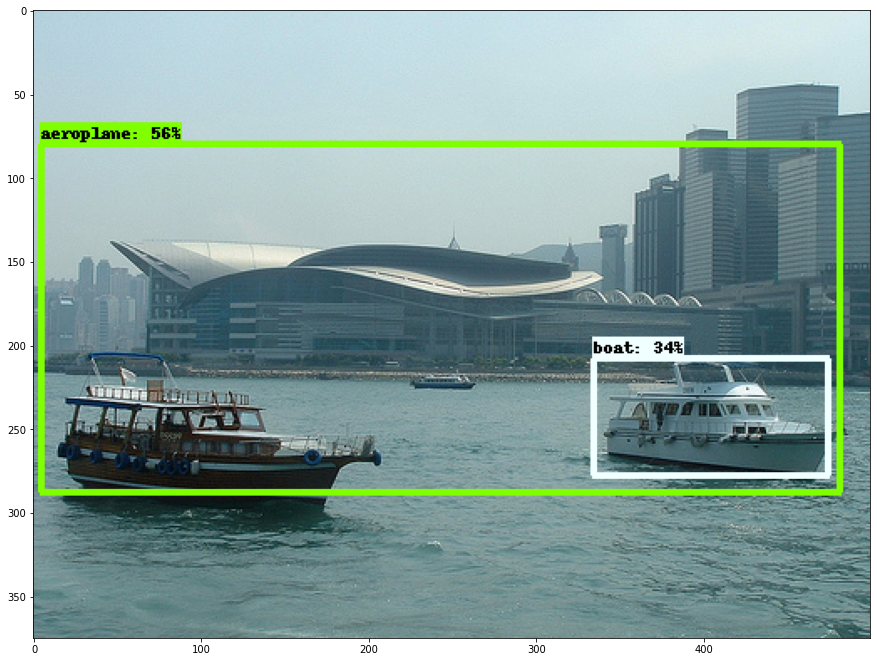

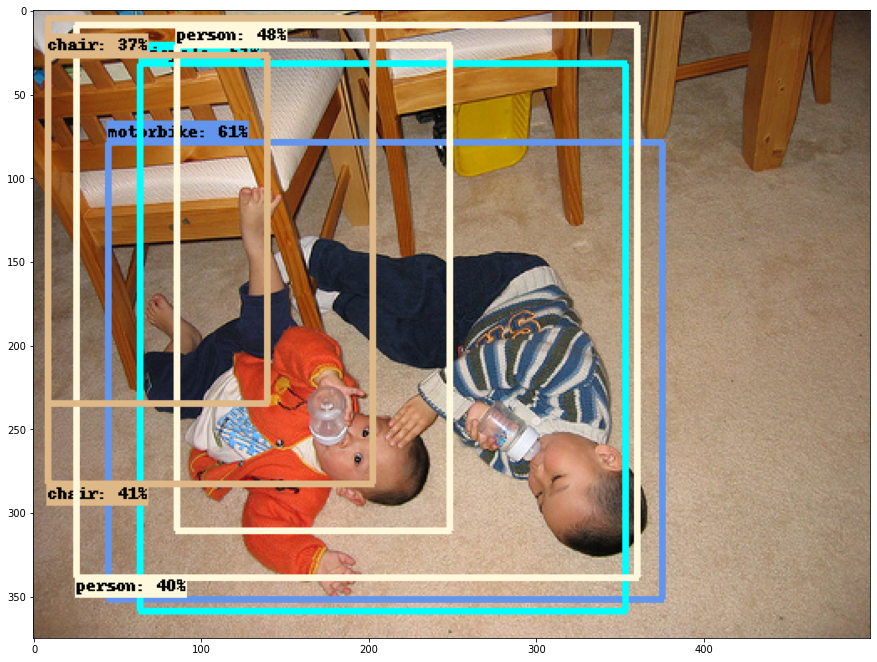

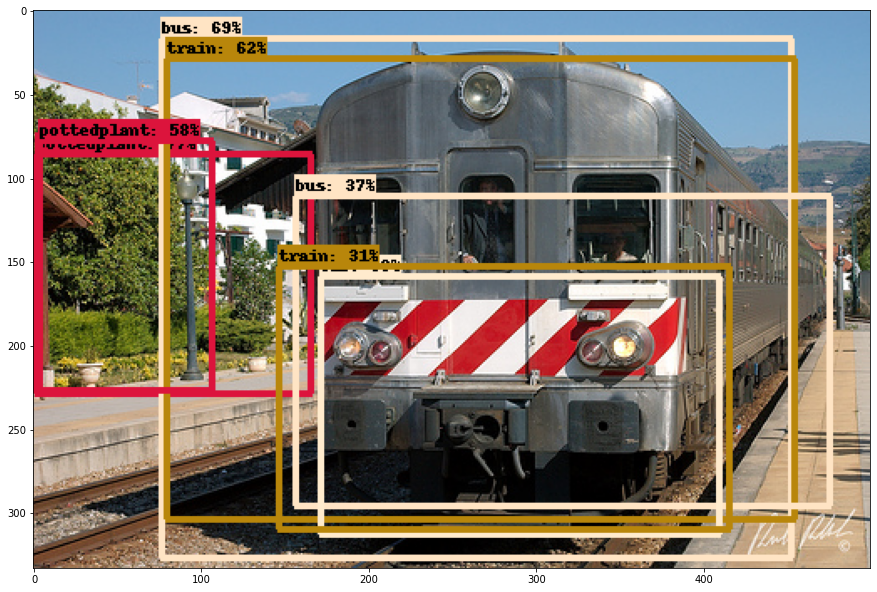

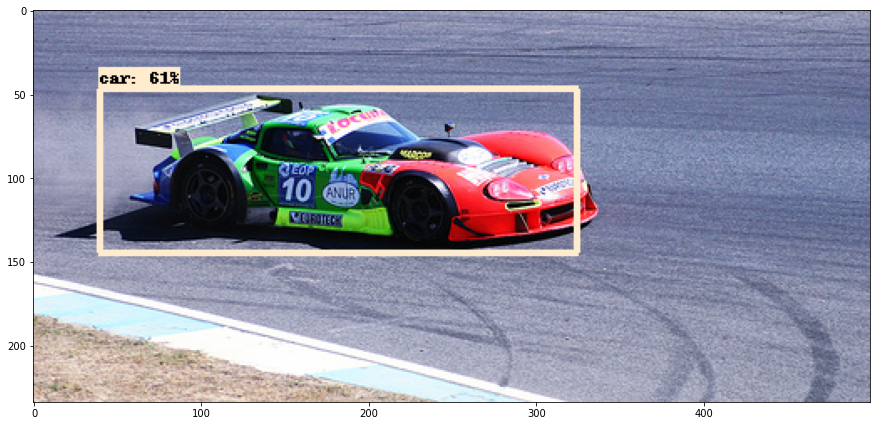

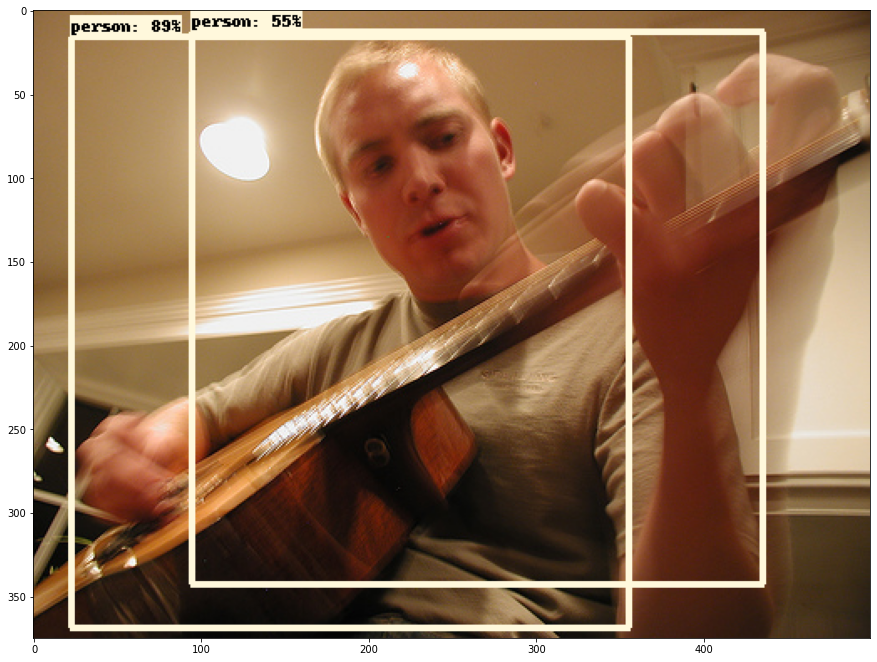

In [ ]:
for image_path in IMAGE_PATHS_SELS:

    print('Running inference for {}... '.format(image_path), end='')

    # image_path = TEST_IMAGE_PATH + image_path
    image_np = load_image_into_numpy_array(image_path)
    
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize=(15,15))
    plt.imshow(image_np_with_detections)
    print('Done')

plt.show()


In [ ]:
!ps

    PID TTY          TIME CMD
      1 ?        00:00:00 docker-init
      7 ?        00:00:17 node
     11 ?        00:00:00 run.sh
     12 ?        00:00:01 kernel_manager_
     27 ?        00:00:01 tail
     39 ?        00:00:03 python3 <defunct>
     40 ?        00:00:14 colab-fileshim.
     67 ?        00:00:14 jupyter-noteboo
     68 ?        00:00:16 dap_multiplexer
     86 ?        00:02:02 python3
    106 ?        00:00:35 python3
    154 ?        00:00:00 bash
    155 ?        00:00:00 drive
    156 ?        00:00:00 grep
    222 ?        00:18:39 drive
    305 ?        00:00:00 bash
    306 ?        00:01:46 directoryprefet
    307 ?        00:00:00 tail
    308 ?        00:00:00 python3
   1419 ?        00:01:07 node
   4445 ?        00:00:03 tensorboard
   4457 ?        00:00:00 server
   4646 ?        00:00:00 ps


In [ ]:
!kill 4445 

In [ ]:
!mkdir "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2"

In [ ]:
!cp "/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
"/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2"

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2" \
--pipeline_config_path="/content/google_drive/MyDrive/Tensorflow_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v2/pipeline.config"

2022-11-15 03:38:05.133150: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-15 03:38:05.850981: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-15 03:38:05.851082: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-11-15 03:38:05.851101: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p